# 📸 `flash-attn` on Sunspot

\| \[Sam Foreman
[<span class="orcid-green"></span>](https://orcid.org/0000-0002-9981-0876)\]()  
2024-05-21

## 🐛 Impact on Loss \[Bug?\]

In the `q4-drop`, it was observed that toggling `flash-attn` on / off
seemed to produce different loss curves (with otherwise *identical
configs*)

``` yaml
TP: 1
PP: 1
GAS: 1
OPT: adamw
dtype: bf16
NLAYERS: 10
MICRO_BATCH: 2
WORLD_SIZE: 24
```

This can be seen clearly in the figure below:

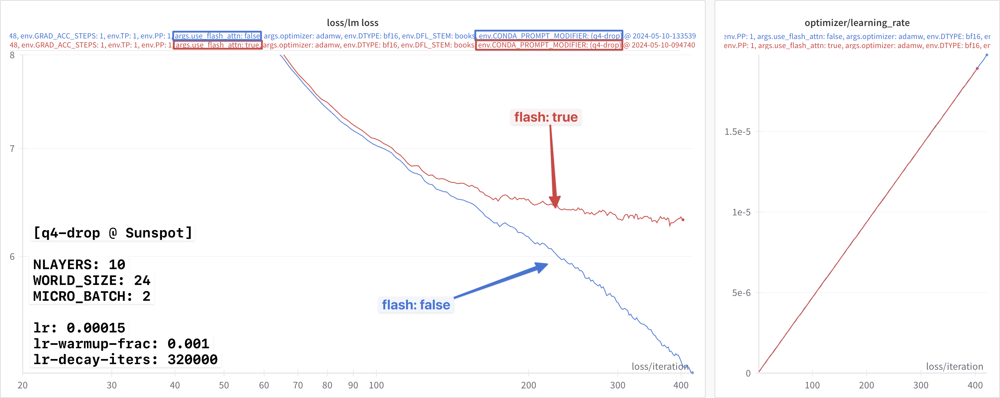

This was identified, and to be addressed in upcoming release.

## 🎁 New LLM Framework Release

### 📦 Initial Release

On 05/14/2024, Intel dropped their new LLM frameworks release:

🎁 <code>frameworks_2024_5_v2</code> Announcement:

Hi Venkat,

We have shared the official Q2 release in two different forms :

Manual Setup: `/gila/Aurora_deployment/anl_24_q2_release.tar.gz`

and 

Module: 

`module use -a /home/jmitche1/anl_release/2024/q2`

`module load frameworks_2024_5_v2`

 Instructions on how to use modules with Q2 build are
anl_24_q2_release/README

-   **The release includes :**
    -   Megatron-DeepSpeed 0.14.2 (with patch)
    -   Intel® Extension for PyTorch\* v2.1.30+xpu
    -   TorchCCL 2.1.300
    -   ONEAPI 2024.1.0.596.PUBLIC_IDP_2024.1.0_723
    -   Agama driver: 803.29
-   The release provides following key features:
    -   Scaleup Performance improvement from the `TorchCCl` prototype
        feature enabled by `TORCH_LLM_ALLREDUCE=1`
         [details](https://urldefense.us/v3/__https://github.com/intel/torch-ccl/releases/tag/v2.1.300*2Bxpu__;JQ!!G_uCfscf7eWS!ZDMnN0Oxp1sCv06MkdlBqFIq0NMAXaCBOtl3fEtBq8Fn4-3iYY5-kPEKr-q4vZIL_i6f2wQbULxAIFJAthJyu3VvNA$)
    -   Auto TP inference support for more workloads
    -   Flash Attention V2 improvement for 256 head dimension support;
        MiCS support.
    -   Latest Features and Optimizations from
        DeepSpeed [0.14.2](https://github.com/microsoft/DeepSpeed/releases/tag/v0.14.2) and
        Intel® Extension for
        PyTorch\* [2.1.30](https://github.com/intel/intel-extension-for-pytorch/tree/v2.1.30*2Bxpu).

Thanks,   
Jerome

### 📸 flash 🤝 📷 no-flash

With this new release, Intel observed that the loss curves agreed
exactly for `flash` / no-`flash`, using the learning rate settings
below:

``` yaml
lr: 0.00015
lr_warmup_frac: 0.01
lr_decay_iters: 320000
```

Testing with Jerome’s new release:

``` sh
module use -a /home/jmitche1/anl_release/2024/q2
module load frameworks_2024_5_v2
```

I was able to independently confirm these results, shown in [📸 flash 🤝
📷 no-flash](#📸%20flash%20🤝%20📷%20no-flash) below.

🔗 <code>wandb</code> links:

-   \[✅ `flash`\] W&B Run:
    [youthful-river-1832](https://wandb.ai/aurora_gpt/AuroraGPT/runs/716r5rnq/overview?nw=nwuserforemans)
-   \[❌ `flash`\] W&B Run:
    [earthy-wave-1830](https://wandb.ai/aurora_gpt/AuroraGPT/runs/120ln0b4/overview?nw=nwuserforemans)

📸 <code>flash</code> vs. 📷 <code>no-flash</code>

<figure>
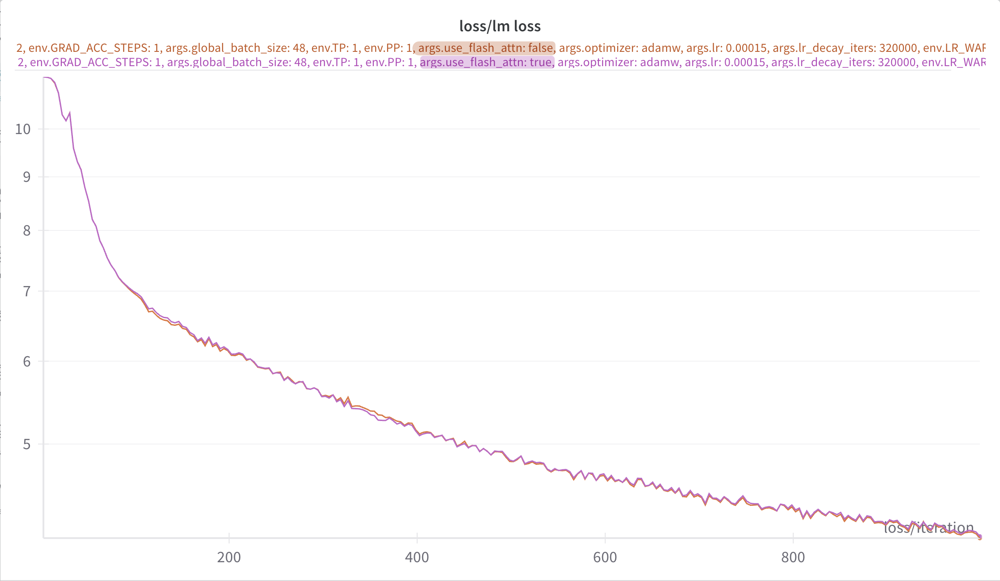
<figcaption aria-hidden="true">📸 flash</figcaption>
</figure>

### 🧰 Broken MPI ??

For whatever reason, things seemed to have spontaneously broken on the
night of 2024-04-14.

When trying to run experiments the following day (05/15/2024) I was met
with this[1]:

``` sh
Abort(15): Fatal error in internal_Init_thread: Other MPI error
```

which was discussed further in [this
thread](https://github.com/pmodels/mpich/pull/7001) on slack.

It seems Subrata also encountered a similar issue \[see: [slack
thread](https://cels-anl.slack.com/archives/C047E7ZTUUF/p1715985162970119)\]

[1] https://github.com/pmodels/mpich/pull/7001

✅ <code>mpi4py</code> fix

To resolve this

``` sh
Abort(15): Fatal error in internal_Init_thread: Other MPI error
```

issue we can simply load the correct modules:

``` sh
module use -a /home/jmitche1/anl_release/2024/q2
module load frameworks_2024_5_v2
module use /home/ftartagl/graphics-compute-runtime/modulefiles
module load graphics-compute-runtime/agama-ci-devel-803.29 
module load spack-pe-gcc/0.6.1-23.275.2 gcc/12.2.0
module use /soft/preview-modulefiles/24.086.0
module load oneapi/release/2024.04.15.001
```

For full details see [mpi4py-reproducer](mpi4py-reproducer.md), and this
\[[slack
thread](https://cels-anl.slack.com/archives/C05V0SRAVB6/p1715867557424879)\].

### 📊 Framework Comparison ??

As I was re-building MPI, and after talking to Jerome, I realized that
*most* of the dependencies are already present in the provided
`frameworks/` modules on Sunspot.

As a simple test, I tried building a new environment built on the base
`conda` environment[1] provided by the`frameworks/2023.12.15.001`
module, which worked without modification and had ) *most* of what I
needed already installed:

``` python
>>> import torch
>>> torch.__version__
'2.1.0a0+cxx11.abi'
>>> import intel_extension_for_pytorch as ipex
>>> ipex.__version__
'2.1.10+xpu'
>>> from mpi4py import MPI
```

The remaining dependencies were installed according to the instructions
from the **new** release `frameworks_2024_5_v2`.

Details included below.

[1] Explicitly, `aurora_nre_models_frameworks-2024.0`, abbreviated as
`2024.0`

📦 <code>pip</code> Install Dependencies

Unfortunately, the `frameworks/**` don’t appear to provide DeepSpeed.

We can create a virtual environment on top of the base conda by

``` sh
$ module use frameworks/2023.12.15.001
$ export PBS_O_WORKDIR=$(pwd) ; source ALCF/helpers.sh && setup_venv_from_conda
```

Once the `venv` has been created and activated, we can install the
remaining dependencies:

To build / install DeepSpeed, along with its required dependencies:

-   `intel-extension-for-deepspeed`:

    ``` sh
    python3 -m pip install intel_extension_for_pytorch_deepspeed\=\=2.1.30 -f "https://pytorch-extension.intel.com/release-whl/stable/xpu/us/intel-extension-for-pytorch-deepspeed/"
    ```

-   `DeepSpeed`:

    ``` sh
    echo "build deepspeed"
    git clone https://github.com/microsoft/DeepSpeed.git
    cd DeepSpeed
    git remote add yizhou_ds https://github.com/YizhouZ/DeepSpeed.git
    git fetch yizhou_ds
    git checkout yizhou/kernel_path
    pip install -r requirements/requirements.txt
    python setup.py develop |& tee build.log
    ```

-   Extras:

    ``` sh
    python3 -m pip install transformers datasets python-etcd tensorboardX packaging sentencepiece bitsandbytes tiktoken neural-speed einops intel-extension-for-transformers
    ```

Looking around the available modules a bit, I noticed a newer frameworks
release (`frameworks/2024.04.15.002`) that had a newer version of both
`torch` and `ipex`:

``` sh
module use /soft/preview-modulefiles/24.086.0
module load frameworks/2024.04.15.002.lua
python3 -c 'from mpi4py import MPI; print(MPI.__file__)'
# /soft/datascience/aurora_nre_models_frameworks-2024.1_preview_u1/lib/python3.9/site-packages/mpi4py/MPI.cpython-39-x86_64-linux-gnu.so
```

``` python
>>> import torch
>>> torch.__version__
'2.1.0.post2+cxx11.abi'
>>> import intel_extension_for_pytorch as ipex
>>> ipex.__version__
'2.1.30+xpu'
>>> from mpi4py import MPI; print(MPI.__file__)
/soft/datascience/aurora_nre_models_frameworks-2024.1_preview_u1/lib/python3.9/site-packages/mpi4py/MPI.cpython-39-x86_64-linux-gnu.so
```

The remaining dependencies were installed identically to what was just
done previously for the `frameworks/2023.12.15.001` module.

**NOTE**: In the figures below, we denote these two environments as:

-   `2024.0`:
    -   `module load frameworks/2023.12.15.001`
-   `2024.1`:
    -   `module use /soft/preview-modulefiles/24.086.0`
    -   `module load frameworks/2024.04.15.002.lua`
-   `anl_24_q2_release`:
    -   `eval "$(~/miniconda3/bin/conda shell.zsh hook)"`
    -   `conda activate anl_24_q2_release`

### 🥸 Fix in Disguise

Armed now with functional environment(s) for
[`argonne-lcf/Megatron-DeepSpeed`](https://github.com/argonne-lcf/Megatron-DeepSpeed),
I was able to resume my previous experiments.

From the discussion with Intel, it was hard to understand / reason about
*why* the `flash-attn` fix would have *any* dependence on the learning
rate schedule (warmup + decay).

If the `flash-attn` fix works for a particular learning rate schedule,
you would reasonably expect that it should work for *any* learning rate
schedule.

An additional source of confusion for me was that the discrepancy in the
loss curves (seemingly) disappeared when using the learning rate
settings provided by Intel[1], but not when using the ALCF defaults[2].

After thinking about it for a bit and trying to reason about possible
causes, I wondered if it might not be a mix of multiple different
factors:

1.  Small learning rate
2.  Very long decay
3.  \[maybe ?\] somehow dependent on the learning rate warmup fraction
    1.  preliminary experiments seemed to suggest this was not the case

So, I was curious what would happen if I used the (larger) learning rate
value from the ALCF defaults (`lr=0.003`) with the very long
`lr-decay-iters: 320000` from Intel.

These results are shown below.

In particular, for all three experiments the following learning rate
settings were used:

``` yml
lr: 0.0003
lr-warmup-frac: 0.05
lr-decay-iters: 320000
```

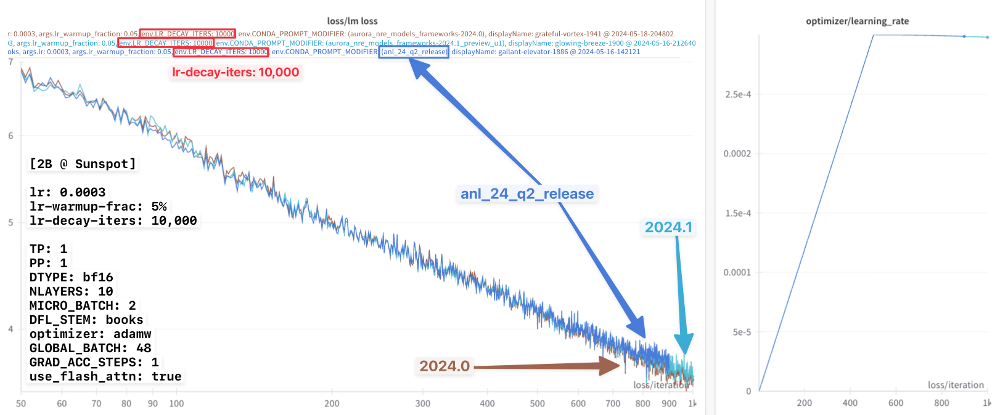
Looking at this figure ^, it appears that up until the very very end,
all three loss curves agree *identically*.

However, if we look closely at the very end, it looks like there *might*
be a *slight* difference beginning to appear between the `2024.0` (brown
line) and `{anl_24_q2_release, 2024.1}` ({dark, light} blue lines,
respectively).

Thinking that I might be onto something, I then tried again with a
smaller `lr-decay-iters: 5000`.

This result is shown below:

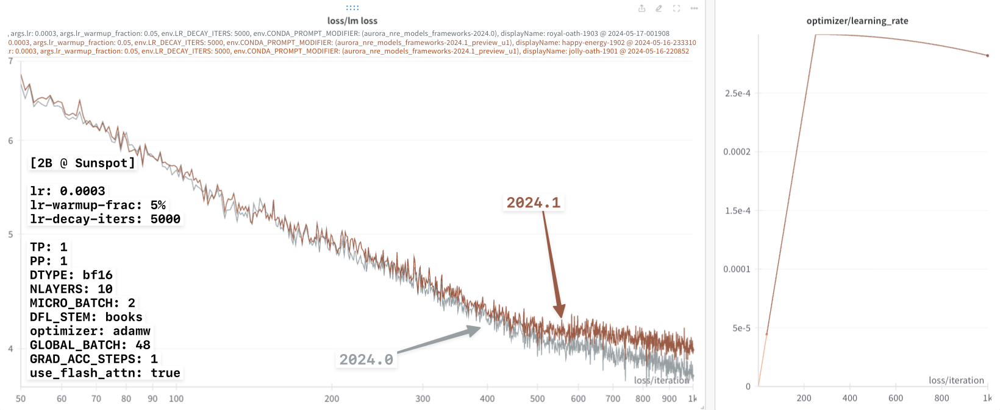
In particular, we can now more clearly see the difference beginning to
appear between the `2024.0` and `2024.1` loss curves.

Continuing on, we see this effect become increasingly dramatic with even
smaller values of `lr-decay-iters`:

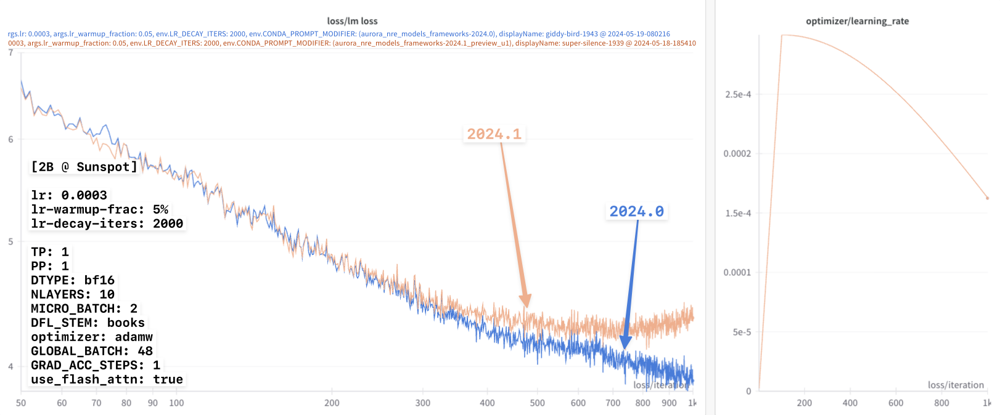
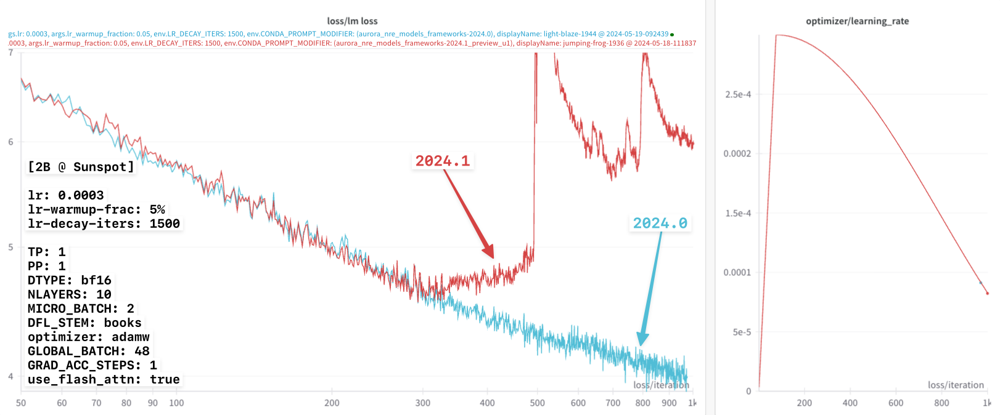

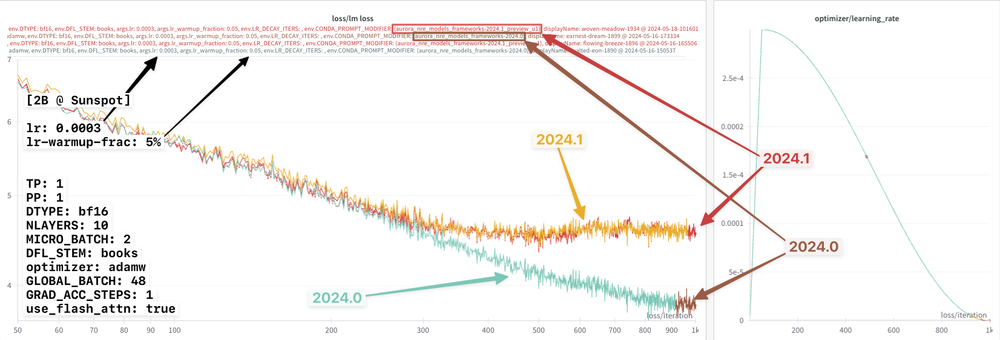
In each of these experiments, it appears that:

-   `2024.0`:
    -   Not impacted by this `lr-decay-iters` dependence
    -   Continue to decrease for the duration of training
-   `2024.1`:
    -   Impacted by the `lr-decay-iters` dependence
    -   Plateaus towards the end of training

> \[!TLDR\]- Older Figs.
>
> 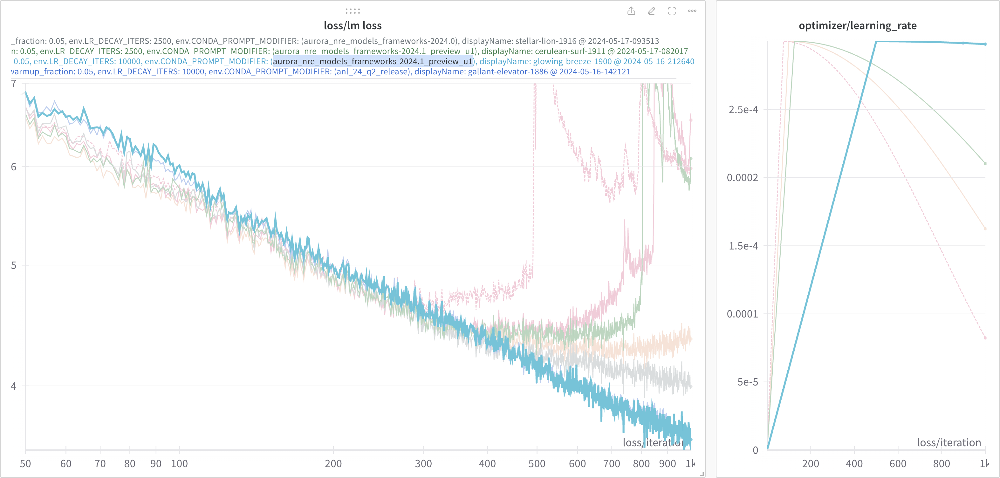
> 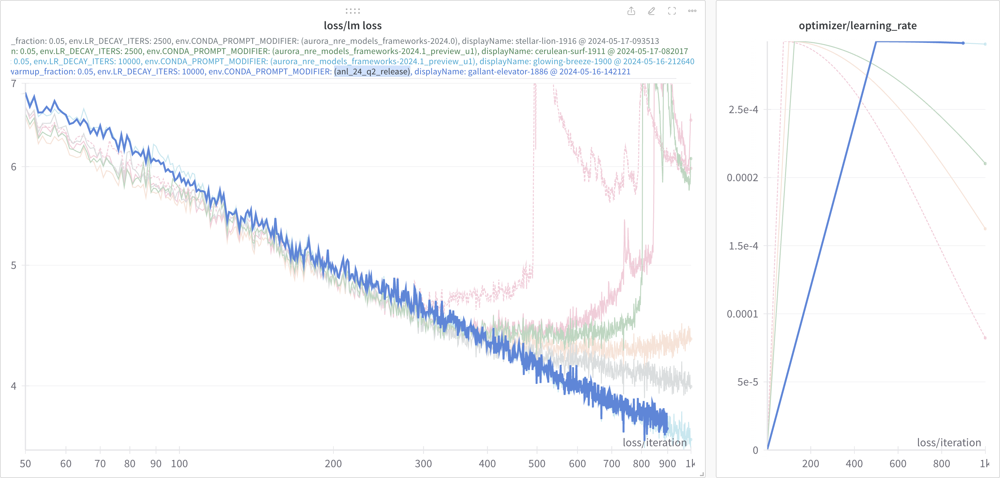

### ✅ `2024.0` Fix

**Everything** seems to work with

``` sh
module load frameworks/2023.12.15.001
```

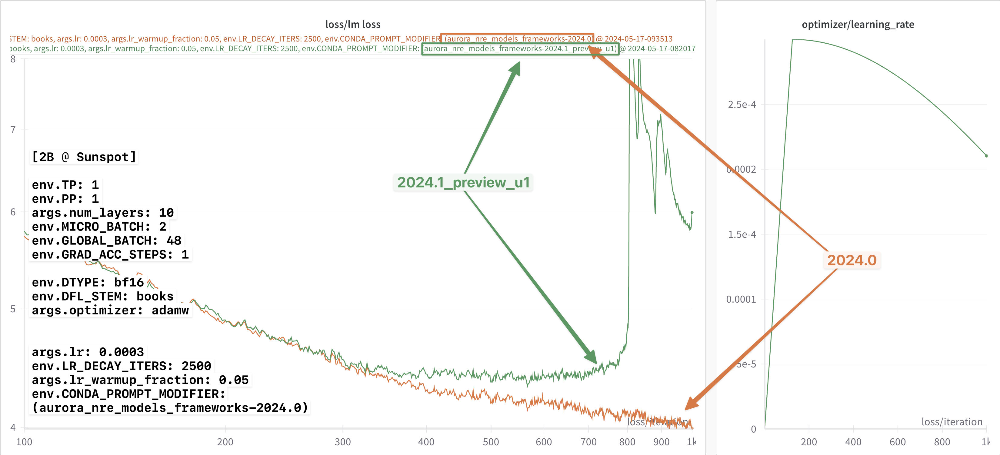
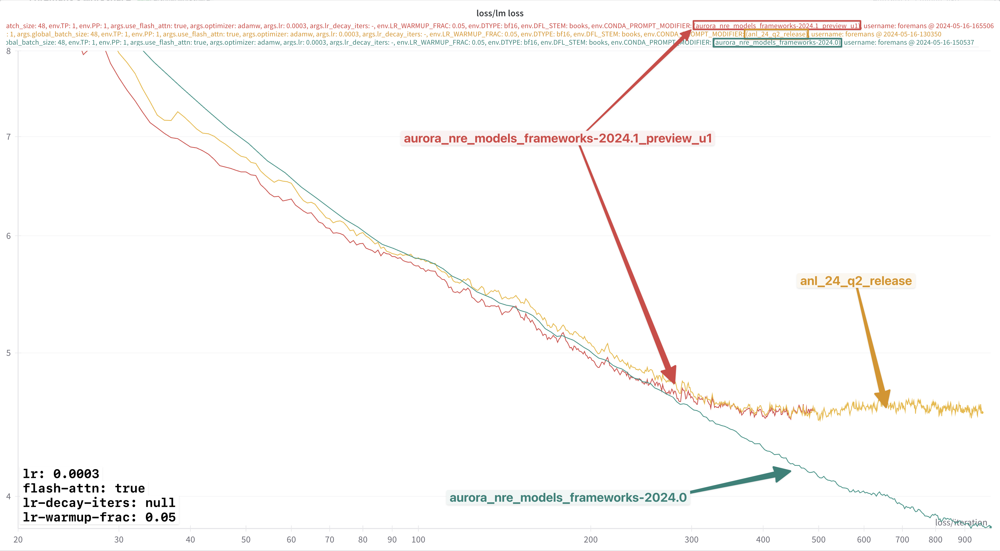

### 📊 `lr-decay-iters` Comparison

-   `2024.0`:
    -   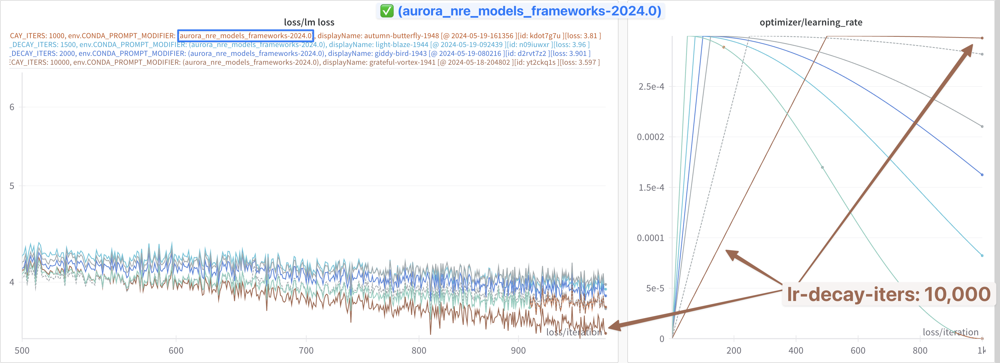
-   `2024.1`:
    -   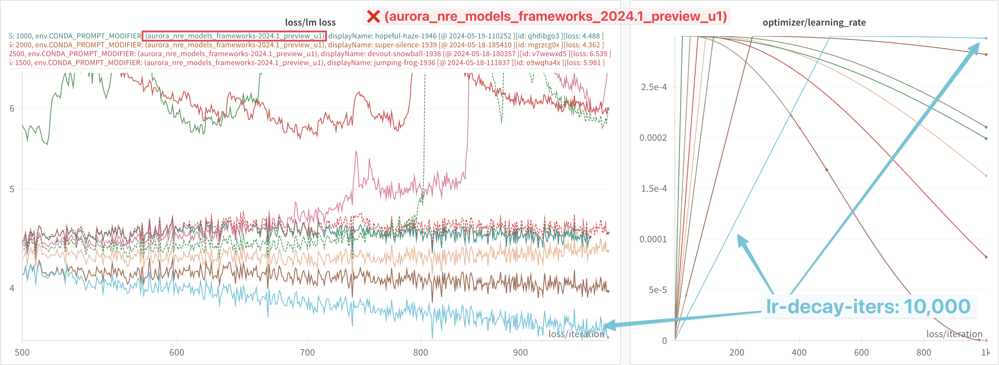

## 📈 `lr-decay-iters` dependence

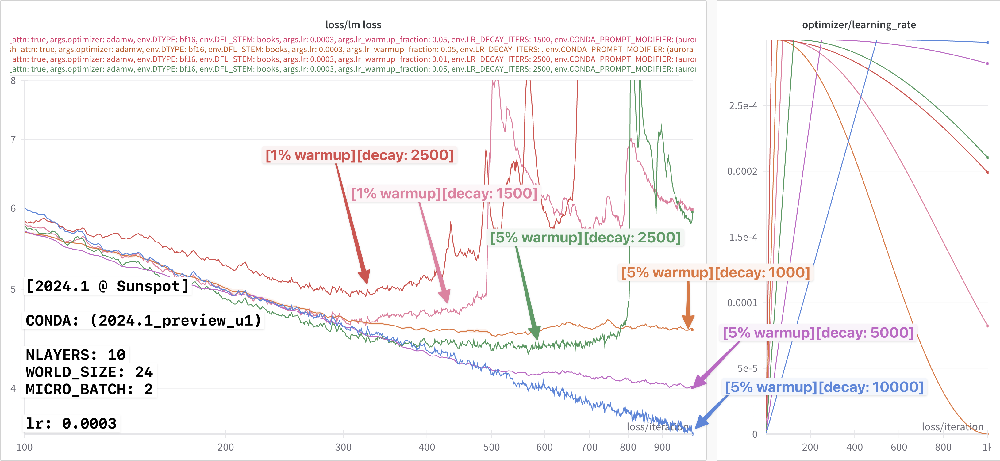

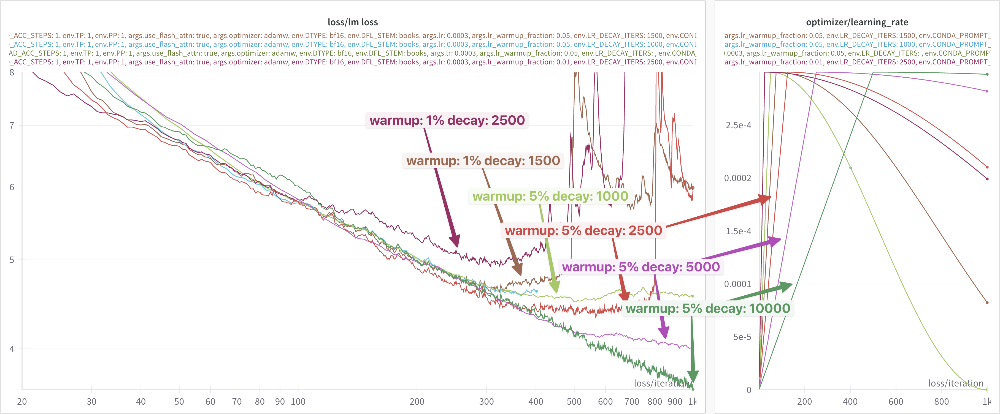
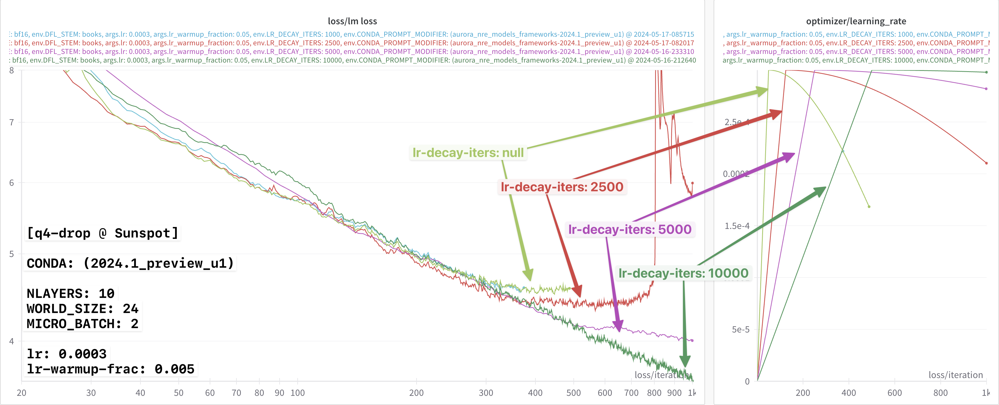

## 🏎️ Performance Improvement in `2024.1`

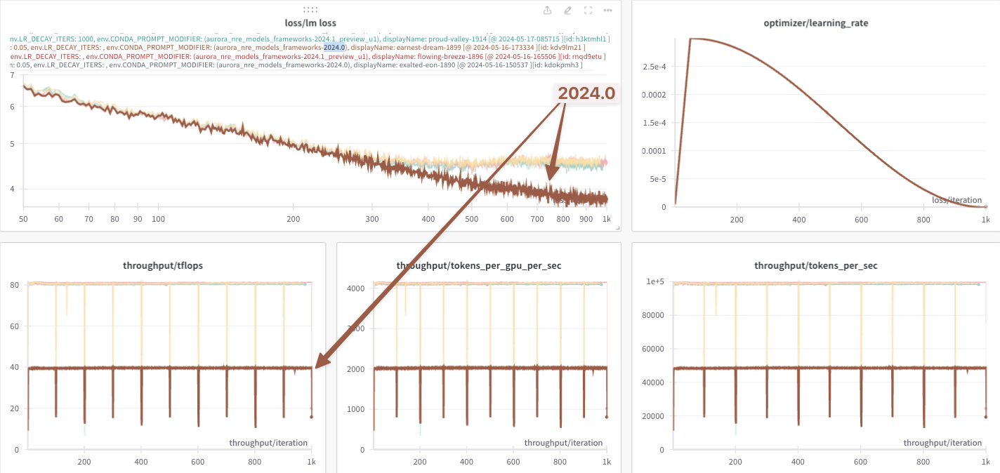

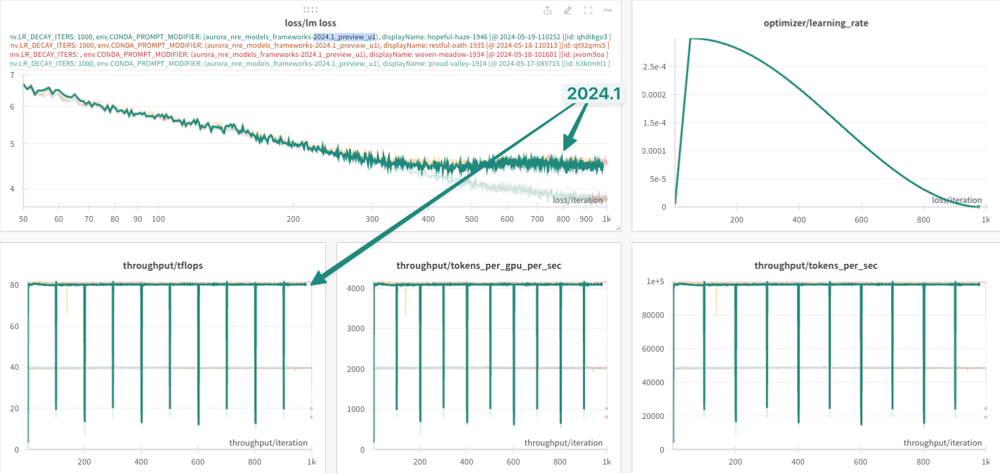

[1] Intel used the following learning rate schedule in their
experiments:

``` yml
lr: 0.00015
lr-warmup-frac: 0.01
lr-decay-iters: 320000
```

[2] ALCF used the following learning rate schedule in their experiments:

``` yml
lr: 0.0003
lr-warmup-frac: 0.05
lr-decay-iters: null
```